# Large Bubbles Error Detection

This file contains the algorithm to detect the large bubbles inside the cardboards

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os

In [47]:
def undistort_image(image, mtx, dist):
    """
    Undistort the image using the camera matrix and distortion coefficients.
    """
    h, w = image.shape[:2]
    new_camera_mtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
    undistorted_img = cv.undistort(image, mtx, dist, None, new_camera_mtx)
    return undistorted_img

def mask_image(image, kernelSize):
    # Recieves blurred image and returns a mask of the contour
    contour_mask = np.zeros_like(image, dtype=np.uint8)

    # Thresholding the imnage OTSU gives us the optimal threshold value
    _ , th_Bin_OTSU = cv.threshold(image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
    # Find the contours in the image
    contours, _ = cv.findContours(th_Bin_OTSU, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # We search the biggest contour Area Based
    contour_max = max(contours, key=cv.contourArea)

    # Bounding box of the biggest contour
    x, y, w, h = cv.boundingRect(contour_max)

    # We expand the ROI
    margin = 10  # Additional pixels to the ROI
    x_roi = max(x - margin, 0)
    y_roi = max(y - margin, 0)
    w_roi = min(w + 2 * margin, th_Bin_OTSU.shape[1] - x_roi)
    h_roi = min(h + 2 * margin, th_Bin_OTSU.shape[0] - y_roi)  #With ROI coordinates we can select the desired part of the image
    # We use the ROI found in the previous step
    roi = th_Bin_OTSU[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

    # We apply the canny on the ROI
    canny_edges_roi = cv.Canny(roi, 50, 110, L2gradient=True)
    # print("Borders detected:", np.count_nonzero(canny_edges_roi))

    # Dilate the edges
    kernel = np.ones((2, 2), np.uint8)
    canny_edges = cv.dilate(canny_edges_roi, kernel, iterations=1)
    
    # Crear máscara del mismo tamaño que la imagen, inicialmente negra
    contour_mask = np.zeros_like(image, dtype=np.uint8)
    
    # Obtener el contorno más grande en la imagen (dentro del ROI binarizado)
    contours, _ = cv.findContours(canny_edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv.contourArea)

    # Usar contorno real en lugar del convex hull
    contour_offset = max_contour + np.array([[[x_roi, y_roi]]])

    # Dibujar el contorno exterior (relleno blanco) sobre la máscara
    cv.drawContours(contour_mask, [contour_offset], -1, color=255, thickness=-1)

    # Aplicar erosión para "encoger" el área del contorno
    mask_size = kernelSize # tamaño del kernel de erosión
    kernel = np.ones((mask_size, mask_size), np.uint8)  # puedes ajustar el tamaño para más o menos reducción
    contour_mask_eroded = cv.erode(contour_mask, kernel, iterations=1)
    
    return contour_mask_eroded

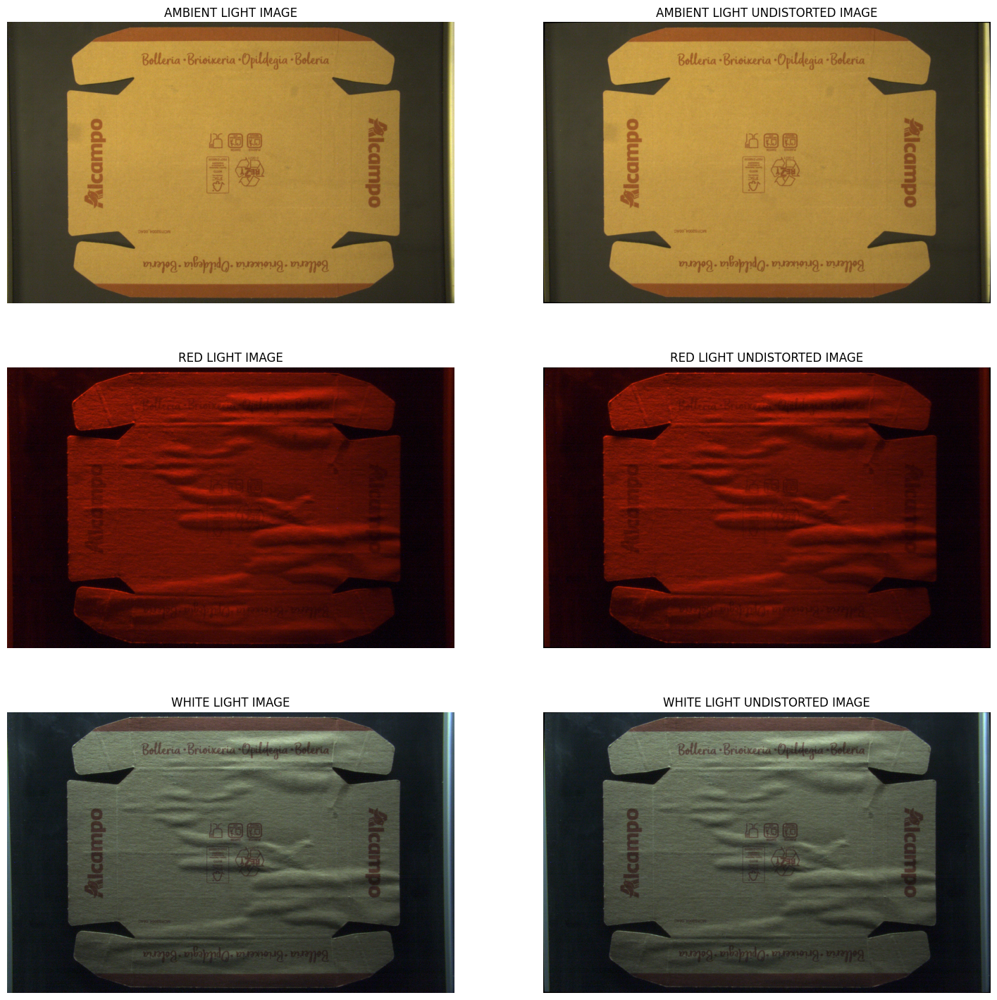

In [48]:
# Working directory
baseFolder = os.getcwd()

# image Number
imageNumber = 1

if imageNumber == 1:
    # Load the image with Ambient Light
    AL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_ROOM_LIGHT.png'))

    # Load the image with the red Light
    RL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_RED_LIGHT_2.png'))

    # Load the iage with the white Light
    WL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '1_WHITE_LIGHT.png'))
else:
    # Load the image with Ambient Light
    AL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_WHITE_LIGHT_2.png'))

    # Load the image with the red Light
    RL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_RED_LIGHT_2.png'))

    # Load the iage with the white Light
    WL_img = cv.imread(os.path.join(baseFolder, 'FINAL_PHOTOS', 'BUBBLES_RETAKE', '2_WHITE_LIGHT_1.png'))

# Loading the camera parameters obtained from the calibration process
cameraParameters = np.load(baseFolder + "/calibration/camera_lens_12mm.npz")

# We extract the camera matrix and distortion coefficients, through the keys in the dictionary
mtx = cameraParameters['mtx']
dist = cameraParameters['dist']
res = cameraParameters['res']

# Undistort the images using the camera parameters
udst_AL_img = undistort_image(AL_img, mtx, dist)
udst_RL_img = undistort_image(RL_img, mtx, dist)
udst_WL_img = undistort_image(WL_img, mtx, dist)

plt.figure(figsize=(18, 18))

plt.subplot(3, 2, 1)
plt.imshow(cv.cvtColor(AL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("AMBIENT LIGHT IMAGE")
plt.subplot(3, 2, 2)
plt.imshow(cv.cvtColor(udst_AL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("AMBIENT LIGHT UNDISTORTED IMAGE")

plt.subplot(3, 2, 3)
plt.imshow(cv.cvtColor(RL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("RED LIGHT IMAGE")
plt.subplot(3, 2, 4)
plt.imshow(cv.cvtColor(udst_RL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("RED LIGHT UNDISTORTED IMAGE")

plt.subplot(3, 2, 5)
plt.imshow(cv.cvtColor(WL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("WHITE LIGHT IMAGE")
plt.subplot(3, 2, 6)
plt.imshow(cv.cvtColor(udst_WL_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.title("WHITE LIGHT UNDISTORTED IMAGE")

plt.show()


## Region of Interest

We are going to focus on the ambient ligth image for finding the borders of the cardboard and use only this section of the image, for that reason we are going to start by doing an optimal threshold of the image, using OTSU

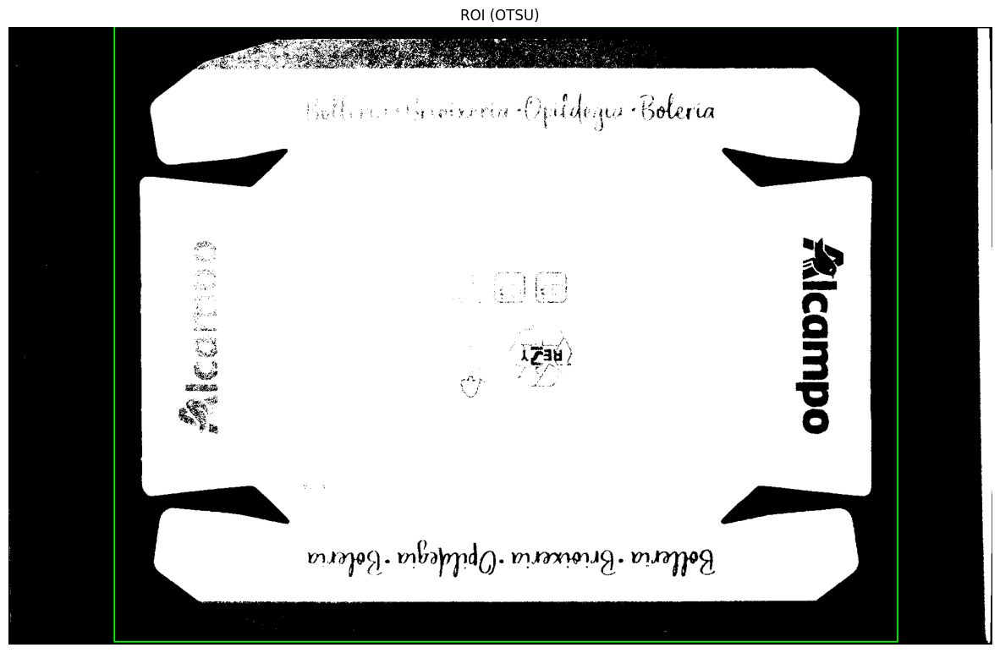

In [49]:
# Thresholding the imnage OTSU gives us the optimal threshold value
udst_AL_gray = cv.cvtColor(udst_AL_img, cv.COLOR_BGR2GRAY)
_ , th_Bin_OTSU = cv.threshold(udst_AL_gray, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Find the contours in the image
contours, _ = cv.findContours(th_Bin_OTSU, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# We search the biggest contour Area Based
contour_max = max(contours, key=cv.contourArea)

# Bounding box of the biggest contour
x, y, w, h = cv.boundingRect(contour_max)

# We expand the ROI
margin = 50  # Additional pixels to the ROI
x_roi = max(x - margin, 0)
y_roi = max(y - margin, 0)
w_roi = min(w + 2 * margin, th_Bin_OTSU.shape[1] - x_roi)
h_roi = min(h + 2 * margin, th_Bin_OTSU.shape[0] - y_roi)

# Draw a green rectangle using BGR
img_with_roi = cv.cvtColor(th_Bin_OTSU, cv.COLOR_GRAY2BGR)
cv.rectangle(img_with_roi, (x_roi, y_roi), (x_roi + w_roi, y_roi + h_roi), (0, 255, 0), 2)

# We show the image with the ROI detected
plt.figure(figsize=(15, 10))
plt.imshow(img_with_roi)
plt.title("ROI (OTSU)")
plt.axis("off")
plt.show()

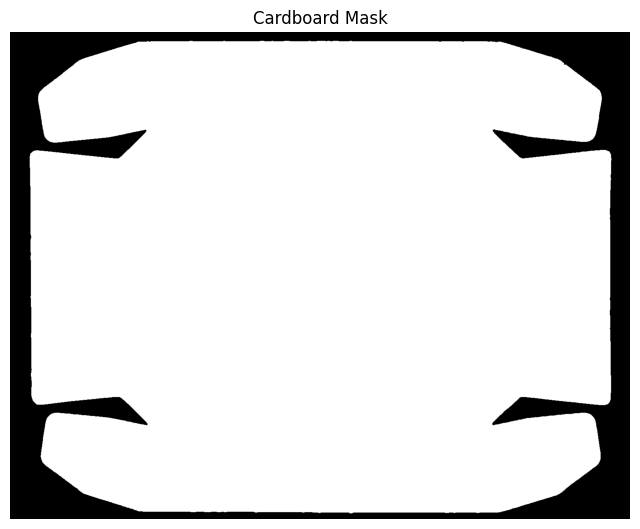

In [50]:
# Wa apply a gaussian blur to the image to reduce noise
blur = cv.GaussianBlur(udst_AL_gray, (5, 5), 0)

# Start by extracting the ROI from the blurre image
roi = blur[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

# We apply the Canny edge detection algorithm to the ROI
canny_edges_roi = cv.Canny(roi, 40, 130, L2gradient=True)

# We are going to dilate the edges to make them more pronounced
kernel = np.ones((2, 2), np.uint8)
canny_edges = cv.dilate(canny_edges_roi, kernel, iterations=1)

# We had to add a morphological operation to close small gaps in the edges
# Required to connect the small red pieces in the borders of the cardboard
kernel_close = np.ones((5, 5), np.uint8)
closed = cv.morphologyEx(canny_edges, cv.MORPH_CLOSE, kernel_close)

# This final step is to assure that the edges are well defined and the 
# cardboard contour is clearly visible
dilated = cv.dilate(closed, np.ones((3, 3), np.uint8), iterations=1)

# We find the contours in the image
contours, _ = cv.findContours(dilated, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# We take the largest contour based on area
max_contour = max(contours, key=cv.contourArea)

# We create the cardboard mask
cardboard_mask = np.zeros_like(canny_edges, dtype=np.uint8)
cv.drawContours(cardboard_mask, [max_contour], -1, 255, thickness=cv.FILLED)

# 9. Visualizar resultado
plt.figure(figsize=(8, 8))
plt.imshow(cardboard_mask, cmap='gray')
plt.title("Cardboard Mask")
plt.axis("off")
plt.show()

## Analysis on the Red Light photo

Based on the found ROI and cardboard mask we are ready to work on the cardboard iluminated in tangential direction

0 1210 208 1541


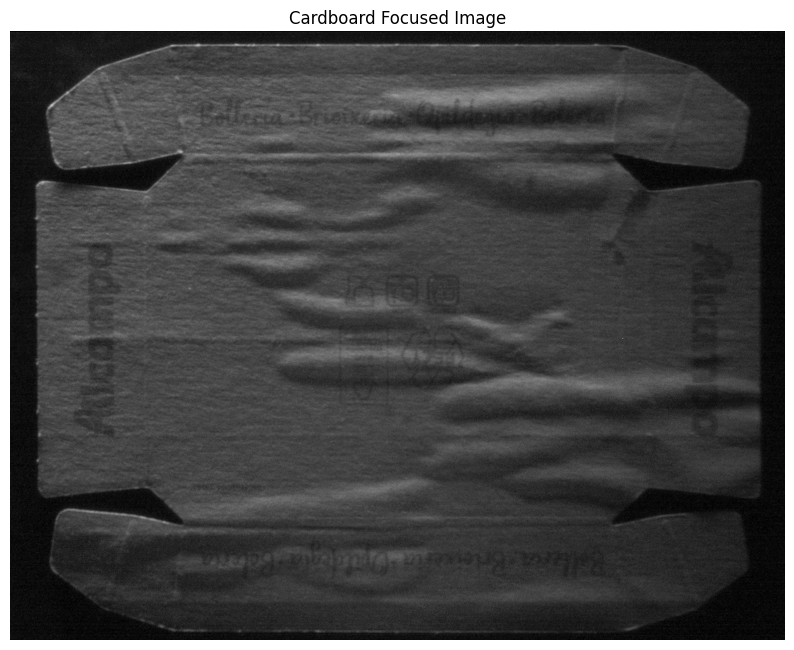

In [51]:
# For the analysis we need to convert the image to grayscale
udst_RL_gray = cv.cvtColor(udst_RL_img, cv.COLOR_BGR2GRAY)
udst_WL_gray = cv.cvtColor(udst_WL_img, cv.COLOR_BGR2GRAY)

print(y_roi, h_roi, x_roi, w_roi)

# Start by extracting the ROI from the Red Ligthed image
roi_RL_img = udst_RL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]
roi_AL_img = udst_AL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]
roi_WL_img = udst_WL_gray[y_roi:y_roi+h_roi, x_roi:x_roi+w_roi]

# We apply the mask to the red light image
cardboard_img = cv.bitwise_and(roi_RL_img, cardboard_mask)

# Mostrar el resultado
plt.figure(figsize=(10, 8))
plt.imshow(roi_RL_img, cmap='gray')
plt.title("Cardboard Focused Image")
plt.axis("off")
plt.show()

## Algorithm 2
Another algorithm is proposed

## Opcional

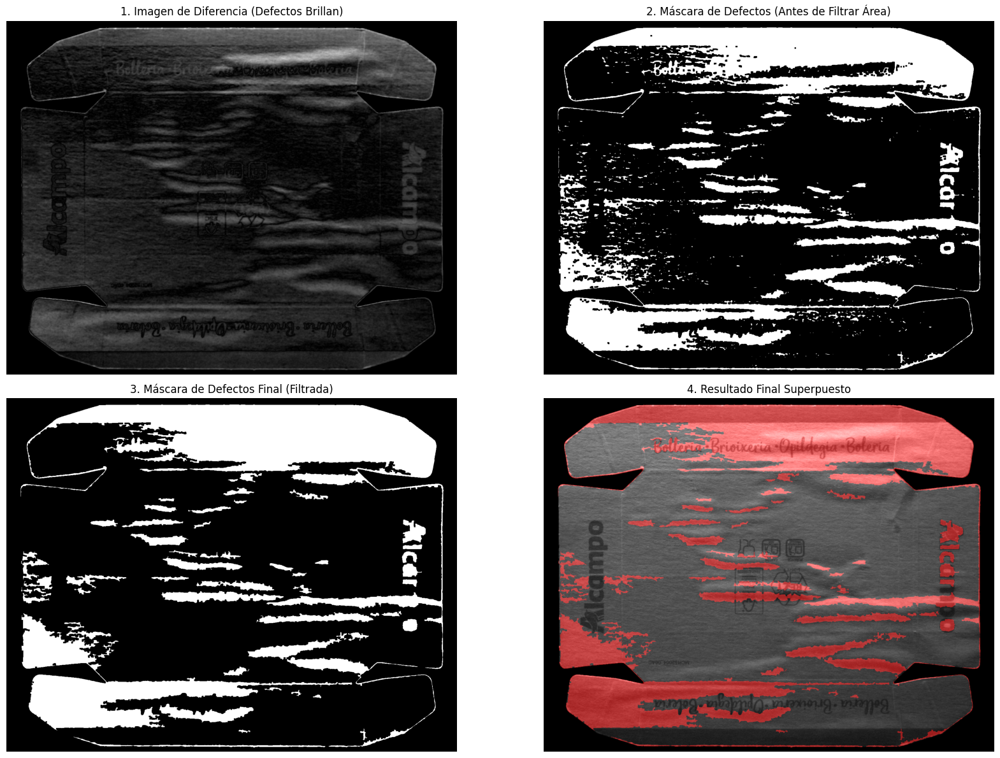

In [81]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- Asumimos que las imágenes y la máscara ya están cargadas ---
# ambient_image = cv.imread(...)
# white_image = cv.imread(...)
# cardboard_mask = ...

# --- PASO 1: PRE-PROCESAMIENTO ---
# Convertir a escala de grises para el análisis
gray_ambient = roi_AL_img.copy()
gray_white = roi_WL_img.copy()

# Aplicar un desenfoque suave para reducir el ruido de alto nivel
# Es importante usar el mismo blur en ambas para una comparación justa
blur_ambient = cv.GaussianBlur(gray_ambient, (7, 7), 0)
blur_white = cv.GaussianBlur(gray_white, (7, 7), 0)


# --- PASO 2: NORMALIZAR EL BRILLO DE LA IMAGEN AMBIENTAL ---
# Hacemos que la imagen ambiental se parezca más a la de luz blanca en términos de iluminación.
# Esto es CRUCIAL para que la resta funcione.
mean_white, std_white = cv.meanStdDev(blur_white, mask=cardboard_mask)
mean_ambient, std_ambient = cv.meanStdDev(blur_ambient, mask=cardboard_mask)

# Normalizamos la imagen ambiental
normalized_ambient = blur_ambient.copy().astype(np.float32)
normalized_ambient = (normalized_ambient - mean_ambient[0][0]) / std_ambient[0][0] * std_white[0][0] + mean_white[0][0]
# Nos aseguramos de que los valores se mantengan en el rango de 8 bits
normalized_ambient = np.clip(normalized_ambient, 0, 255).astype(np.uint8)


# --- PASO 3: CALCULAR LA DIFERENCIA Y AISLAR DEFECTOS ---
# Restamos las dos imágenes. Las zonas iguales se volverán negras.
# Los defectos (arrugas) permanecerán como zonas más claras.
difference_image = cv.absdiff(blur_white, normalized_ambient)

# Aplicamos la máscara principal para ignorar cualquier cosa fuera de la caja
difference_masked = cv.bitwise_and(difference_image, difference_image, mask=cardboard_mask)

# Binarizamos la imagen de diferencia para crear una máscara de defectos cruda.
# ¡ESTE UMBRAL (threshold_value) ES EL PARÁMETRO MÁS IMPORTANTE A AJUSTAR!
threshold_value = 25 # Un valor entre 15 y 30 suele funcionar bien.
_, defects_raw_mask = cv.threshold(difference_masked, threshold_value, 255, cv.THRESH_BINARY)

# Opcional: Limpieza morfológica para unir partes rotas y eliminar ruido
cleanup_kernel = np.ones((5,5), np.uint8)
defects_cleaned_mask = cv.morphologyEx(defects_raw_mask, cv.MORPH_CLOSE, cleanup_kernel)


# --- PASO 4: FILTRAR DEFECTOS POR ÁREA (Lógica ya conocida) ---
min_defect_area = 150 # Ajusta según sea necesario
max_defect_area = 300000 # También puedes establecer un máximo para evitar falsos positivos
contours, _ = cv.findContours(defects_cleaned_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
final_defects_mask = np.zeros_like(defects_cleaned_mask)

for contour in contours:
    area = cv.contourArea(contour)
    if area > min_defect_area and area < max_defect_area:
        cv.drawContours(final_defects_mask, [contour], -1, 255, thickness=cv.FILLED)


# --- Visualización de Resultados ---
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
plt.imshow(difference_masked, cmap='gray')
plt.title("1. Imagen de Diferencia (Defectos Brillan)")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(defects_cleaned_mask, cmap='gray')
plt.title("2. Máscara de Defectos (Antes de Filtrar Área)")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(final_defects_mask, cmap='gray')
plt.title("3. Máscara de Defectos Final (Filtrada)")
plt.axis("off")

# Superponemos el resultado final en la imagen de luz blanca
overlay_final = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
# Creamos una capa de color rojo semitransparente para los defectos
red_overlay = np.zeros_like(overlay_final)
red_overlay[final_defects_mask != 0] = [0, 0, 255]
# Mezclamos la imagen original con la capa de defectos
overlay_final = cv.addWeighted(overlay_final, 1, red_overlay, 0.5, 0)

plt.subplot(2, 2, 4)
plt.imshow(cv.cvtColor(overlay_final, cv.COLOR_BGR2RGB))
plt.title("4. Resultado Final Superpuesto")
plt.axis("off")

plt.tight_layout()
plt.show()

Paso 1: Se encontraron 39 contornos candidatos a defecto.
Paso 2: Se encontraron 182 contornos de la impresión de referencia.
Paso 3: Después del filtro de contacto (50.0%), nos quedamos con 30 defectos reales.


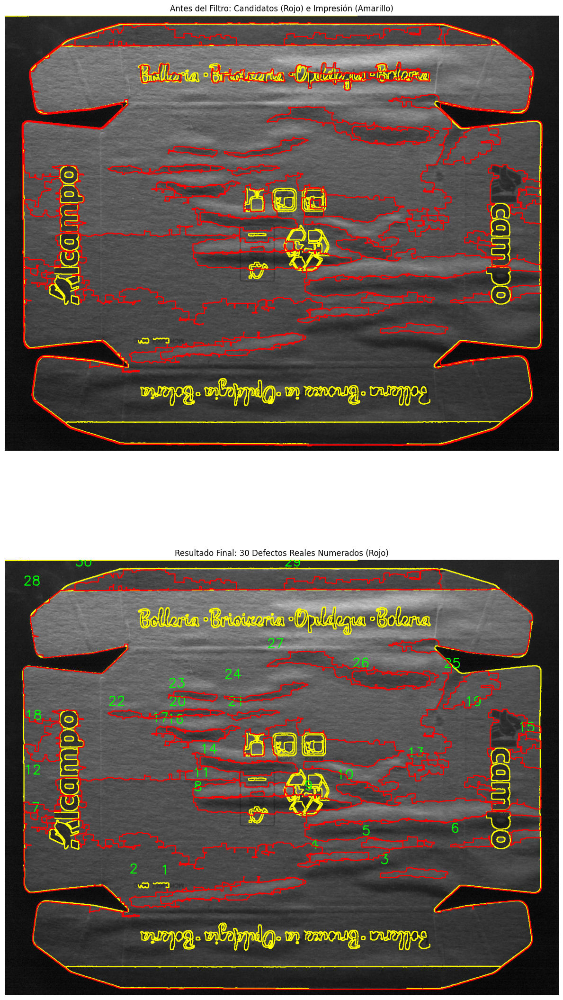

In [113]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- Asumimos que las imágenes y la máscara ya están cargadas ---
# ambient_image = roi_AL_img.copy()
# white_image = roi_WL_img.copy()
# cardboard_mask = ...

# --- PASO 1: OBTENER CONTORNOS CANDIDATOS DE LA IMAGEN BLANCA ---
blur_white = cv.GaussianBlur(white_image, (5, 5), 0)
thValue = 80
_, thTOZERO_full = cv.threshold(blur_white, thValue, 255, cv.THRESH_TOZERO)
thTOZERO_masked = cv.bitwise_and(thTOZERO_full, thTOZERO_full, mask=cardboard_mask)
edges_white = cv.Canny(thTOZERO_masked, 50, 150, apertureSize=3)
border_kernel = np.ones((3,3), np.uint8)
mask_border = cv.morphologyEx(cardboard_mask, cv.MORPH_GRADIENT, border_kernel)
combined_edges = cv.bitwise_or(edges_white, mask_border)
closing_kernel = np.ones((11, 11), np.uint8)
closed_edges = cv.morphologyEx(combined_edges, cv.MORPH_CLOSE, closing_kernel)
contours_candidates, _ = cv.findContours(closed_edges, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)

min_edge_length = 250
large_contours_candidates = [cnt for cnt in contours_candidates if cv.arcLength(cnt, True) > min_edge_length]

print(f"Paso 1: Se encontraron {len(large_contours_candidates)} contornos candidatos a defecto.")

# --- PASO 2: OBTENER CONTORNOS DE REFERENCIA DE LA IMAGEN AMBIENTAL ---
blur_ambient = cv.GaussianBlur(ambient_image, (5, 5), 0)
edges_ambient = cv.Canny(blur_ambient, 50, 120)
reference_contours, _ = cv.findContours(edges_ambient, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

print(f"Paso 2: Se encontraron {len(reference_contours)} contornos de la impresión de referencia.")

# --- PASO 3: FILTRO POR PORCENTAJE DE CONTACTO ---
contact_distance_pixels = 5
contact_threshold_percent = 0.50

reference_map = np.zeros(white_image.shape[:2], dtype='uint8')
cv.drawContours(reference_map, reference_contours, -1, 255, 1)
dist_transform = cv.distanceTransform(255 - reference_map, cv.DIST_L2, 3)

true_defect_contours = []
for candidate in large_contours_candidates:
    total_points = len(candidate)
    if total_points == 0:
        continue

    contact_points_count = 0
    for point in candidate:
        x, y = point[0]
        distance = dist_transform[y, x]
        if distance <= contact_distance_pixels:
            contact_points_count += 1

    contact_ratio = contact_points_count / total_points
    if contact_ratio < contact_threshold_percent:
        true_defect_contours.append(candidate)

print(f"Paso 3: Después del filtro de contacto ({contact_threshold_percent*100}%), nos quedamos con {len(true_defect_contours)} defectos reales.")


# --- VISUALIZACIÓN EN DOS IMÁGENES (CON NUMERACIÓN) ---

# 1. Preparar la primera imagen: "Antes del filtro" (sin cambios)
image_before_filter = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
cv.drawContours(image_before_filter, reference_contours, -1, (0, 255, 255), 2)
cv.drawContours(image_before_filter, large_contours_candidates, -1, (0, 0, 255), 2)

# 2. Preparar la segunda imagen: "Después del filtro" (CON NUMERACIÓN)
image_after_filter = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
cv.drawContours(image_after_filter, reference_contours, -1, (0, 255, 255), 2) # Dibuja referencia amarilla

# --- Bucle para dibujar y numerar cada defecto ---
# Usamos enumerate(..., start=1) para obtener un contador (1, 2, 3...)
for i, contour in enumerate(true_defect_contours, start=1):
    # 1. Dibujar el contorno del defecto en rojo
    cv.drawContours(image_after_filter, [contour], -1, (0, 0, 255), 2)

    # 2. Encontrar una posición para el número
    # Usamos el rectángulo delimitador (bounding box) para obtener la esquina superior izquierda
    x, y, w, h = cv.boundingRect(contour)
    
    # 3. Poner el número sobre la imagen
    # La posición es (x, y - 10) para que el número aparezca un poco por encima del defecto.
    # El color del texto será verde para que destaque.
    font = cv.FONT_HERSHEY_SIMPLEX
    font_scale = 1.2
    font_color = (0, 255, 0) # Verde
    font_thickness = 2
    cv.putText(image_after_filter, str(i), (x, y - 10), font, font_scale, font_color, font_thickness)


# 3. Mostrar ambas imágenes
plt.figure(figsize=(12, 24))

plt.subplot(2, 1, 1)
plt.imshow(cv.cvtColor(image_before_filter, cv.COLOR_BGR2RGB))
plt.title("Antes del Filtro: Candidatos (Rojo) e Impresión (Amarillo)")
plt.axis("off")

plt.subplot(2, 1, 2)
plt.imshow(cv.cvtColor(image_after_filter, cv.COLOR_BGR2RGB))
plt.title(f"Resultado Final: {len(true_defect_contours)} Defectos Reales Numerados (Rojo)")
plt.axis("off")

plt.tight_layout()
plt.show()

Paso 1: Se encontraron 39 contornos candidatos a defecto.
Paso 2: Se encontraron 182 contornos de la impresión de referencia.
Paso 3: Después de filtrar por impresión, quedan 30 defectos.
Paso 4: Después de filtrar por borde de caja (> 1000 píxeles), quedan 30 defectos.
Paso 4.5: Después de filtrar por longitud máxima (< 5000px), quedan 28 defectos finales.


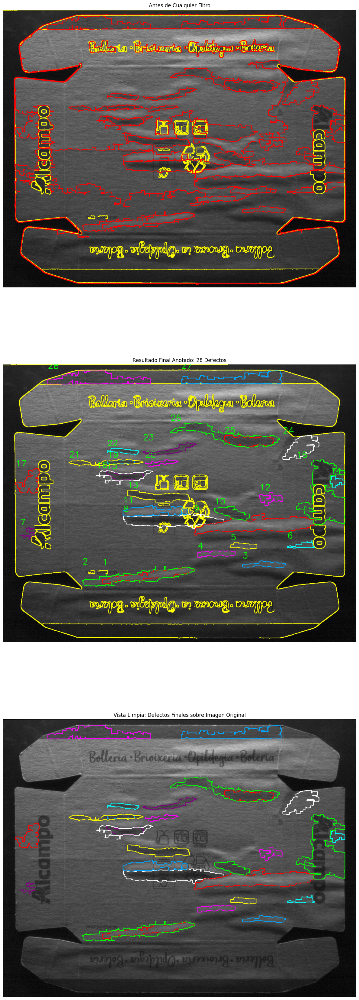

In [122]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# --- Asumimos que las imágenes y la máscara ya están cargadas ---
ambient_image = roi_AL_img.copy()
white_image = roi_WL_img.copy()
# cardboard_mask = ...

# --- PASO 1: OBTENER CONTORNOS CANDIDATOS DE LA IMAGEN BLANCA ---
blur_white = cv.GaussianBlur(white_image, (5, 5), 0)
thValue = 80
_, thTOZERO_full = cv.threshold(blur_white, thValue, 255, cv.THRESH_TOZERO)
thTOZERO_masked = cv.bitwise_and(thTOZERO_full, thTOZERO_full, mask=cardboard_mask)
edges_white = cv.Canny(thTOZERO_masked, 50, 150, apertureSize=3)
border_kernel = np.ones((3,3), np.uint8)
mask_border = cv.morphologyEx(cardboard_mask, cv.MORPH_GRADIENT, border_kernel)
combined_edges = cv.bitwise_or(edges_white, mask_border)
closing_kernel = np.ones((11, 11), np.uint8)
closed_edges = cv.morphologyEx(combined_edges, cv.MORPH_CLOSE, closing_kernel)
contours_candidates, _ = cv.findContours(closed_edges, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)

min_edge_length = 250
large_contours_candidates = [cnt for cnt in contours_candidates if cv.arcLength(cnt, True) > min_edge_length]

print(f"Paso 1: Se encontraron {len(large_contours_candidates)} contornos candidatos a defecto.")

# --- PASO 2: OBTENER CONTORNOS DE REFERENCIA DE LA IMAGEN AMBIENTAL ---
blur_ambient = cv.GaussianBlur(ambient_image, (5, 5), 0)
edges_ambient = cv.Canny(blur_ambient, 50, 120)
reference_contours, _ = cv.findContours(edges_ambient, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

print(f"Paso 2: Se encontraron {len(reference_contours)} contornos de la impresión de referencia.")

# --- PASO 3: FILTRO POR PROXIMIDAD A LA IMPRESIÓN ---
contact_distance_pixels = 5
contact_threshold_percent = 0.50

reference_map = np.zeros(white_image.shape[:2], dtype='uint8')
cv.drawContours(reference_map, reference_contours, -1, 255, 1)
dist_transform = cv.distanceTransform(255 - reference_map, cv.DIST_L2, 3)

true_defect_contours = []
for candidate in large_contours_candidates:
    total_points = len(candidate)
    if total_points == 0:
        continue
    contact_points_count = 0
    for point in candidate:
        x, y = point[0]
        distance = dist_transform[y, x]
        if distance <= contact_distance_pixels:
            contact_points_count += 1
    contact_ratio = contact_points_count / total_points
    if contact_ratio < contact_threshold_percent:
        true_defect_contours.append(candidate)

print(f"Paso 3: Después de filtrar por impresión, quedan {len(true_defect_contours)} defectos.")

# --- PASO 4: FILTRO POR PROXIMIDAD AL BORDE DE LA CAJA ---
edge_contact_distance_pixels = 5
EDGE_MAX_CONTACT_PIXELS = 1000

mask_edge_contours, _ = cv.findContours(cardboard_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
mask_dist_map = np.zeros(white_image.shape[:2], dtype='uint8')
cv.drawContours(mask_dist_map, mask_edge_contours, -1, 255, 1)
mask_dist_transform = cv.distanceTransform(255 - mask_dist_map, cv.DIST_L2, 3)

final_defects = []
for contour in true_defect_contours:
    total_points = len(contour)
    if total_points == 0:
        continue
    edge_contact_points = 0
    for point in contour:
        x, y = point[0]
        distance_to_edge = mask_dist_transform[y, x]
        if distance_to_edge <= edge_contact_distance_pixels:
            edge_contact_points += 1
    if edge_contact_points <= EDGE_MAX_CONTACT_PIXELS:
        final_defects.append(contour)

print(f"Paso 4: Después de filtrar por borde de caja (> {EDGE_MAX_CONTACT_PIXELS} píxeles), quedan {len(final_defects)} defectos.")

# --- ¡NUEVO! PASO 4.5: FILTRO FINAL POR LONGITUD MÁXIMA ---
MAX_CONTOUR_LENGTH = 5000
# Sobrescribimos la lista 'final_defects' con solo los contornos que cumplen la condición.
final_defects = [cnt for cnt in final_defects if cv.arcLength(cnt, True) < MAX_CONTOUR_LENGTH]
print(f"Paso 4.5: Después de filtrar por longitud máxima (< {MAX_CONTOUR_LENGTH}px), quedan {len(final_defects)} defectos finales.")


# --- PASO 5: VISUALIZACIÓN FINAL ---

# 1. Preparar la primera imagen: "Antes del filtro"
image_before_filter = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
cv.drawContours(image_before_filter, reference_contours, -1, (0, 255, 255), 2)
cv.drawContours(image_before_filter, large_contours_candidates, -1, (0, 0, 255), 2)

# 2. Preparar la segunda imagen: "Resultado Final Anotado"
image_after_filter = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)
cv.drawContours(image_after_filter, reference_contours, -1, (0, 255, 255), 2)

# 3. Preparar la tercera imagen: "Defectos sobre Imagen Original"
# MODIFICADO: El fondo ahora es la imagen original
defects_on_image = cv.cvtColor(white_image, cv.COLOR_GRAY2BGR)

# --- Lista de colores para los defectos ---
colors = [
    (0, 0, 255), (0, 255, 0), (255, 165, 0), (255, 0, 255),
    (0, 255, 255), (255, 255, 0), (128, 0, 128), (255, 255, 255)
]

# --- Bucle para dibujar en las imágenes de resultado ---
for i, contour in enumerate(final_defects, start=1):
    color = colors[(i - 1) % len(colors)]
    
    # Dibujar en la imagen de resultado final ANOTADA (con números)
    cv.drawContours(image_after_filter, [contour], -1, color, 2)
    x, y, w, h = cv.boundingRect(contour)
    font = cv.FONT_HERSHEY_SIMPLEX
    cv.putText(image_after_filter, str(i), (x, y - 10), font, 1.2, (0, 255, 0), 2)
    
    # Dibujar en la imagen de "defectos sobre imagen" (sin números ni referencias)
    cv.drawContours(defects_on_image, [contour], -1, color, 2)

# 4. Mostrar las tres imágenes
plt.figure(figsize=(12, 36))

# Subplot 1: Antes de filtrar
plt.subplot(3, 1, 1)
plt.imshow(cv.cvtColor(image_before_filter, cv.COLOR_BGR2RGB))
plt.title("Antes de Cualquier Filtro")
plt.axis("off")

# Subplot 2: Resultado Final Anotado
plt.subplot(3, 1, 2)
plt.imshow(cv.cvtColor(image_after_filter, cv.COLOR_BGR2RGB))
plt.title(f"Resultado Final Anotado: {len(final_defects)} Defectos")
plt.axis("off")

# Subplot 3: Defectos sobre la imagen original
plt.subplot(3, 1, 3)
plt.imshow(cv.cvtColor(defects_on_image, cv.COLOR_BGR2RGB))
plt.title("Vista Limpia: Defectos Finales sobre Imagen Original")
plt.axis("off")

plt.tight_layout()
plt.show()